# Data Wrangling
ในบทนี้ จะเป็นการแนะนำการทำ Data Wrangling หรือการเตรียมข้อมูล ด้วยภาษา `R`

# Install and Load packages

In [1]:
options(
  repr.plot.width=10, 
  repr.plot.height=6, 
  repr.plot.res = 300,
  repr.matrix.max.rows = 10,
  repr.matrix.max.cols = Inf
)

In [2]:
# if running on google colab
# system("
#   apt-get install -y libudunits2-dev
#   apt-get install -y libgdal-dev
#   apt-get install -y gdal-bin
#   apt-get install -y libgeos-dev
#   apt-get install -y libproj-dev
#   apt-get install -y libicu-dev
#   apt-get install -y libcurl4-openssl-dev
#   apt-get install -y libssl-dev
#   apt-get install -y zlib1g-dev
#   apt-get install -y libfontconfig1-dev
#   apt-get install -y libfreetype6-dev
#   apt-get install -y libcairo2-dev
#   apt-get install -y pandoc
#   ")

In [3]:
# options("repos" = "https://packagemanager.rstudio.com/cran/__linux__/bionic/latest/")
# install.packages("RPostgres")
# install.packages("sf")
# install.packages("leaflet")
# install.packages("treemapify")
# install.packages("gganimate")
# install.packages("ggalluvial")
# install.packages("ggsci")
# install.packages("hrbrthemes")

In [4]:
options(scipen = 999)
library(tidyverse)
library(DBI)
library(RPostgres)
library(sf)
library(leaflet)
library(treemapify)
library(gganimate)
library(ggalluvial)
library(ggsci)
library(plotly)
library(hrbrthemes)
library(gapminder)

-- Attaching packages ------------------------------------------------------------------------------------------------------------------------------------------------ tidyverse 1.3.1 --

v ggplot2 3.3.5     v purrr   0.3.4
v tibble  3.1.2     v dplyr   1.0.7
v tidyr   1.1.3     v stringr 1.4.0
v readr   1.4.0     v forcats 0.5.1

-- Conflicts --------------------------------------------------------------------------------------------------------------------------------------------------- tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()

Linking to GEOS 3.9.0, GDAL 3.2.1, PROJ 7.2.1


Attaching package: 'plotly'


The following object is masked from 'package:ggplot2':

    last_plot


The following object is masked from 'package:stats':

    filter


The following object is masked from 'package:graphics':

    layout




# Load Data

## setting path

In [5]:
getwd()

[1] "C:/Users/Acer/Google Drive/workshop/2021-08-24_introR/notebook"

In [6]:
setwd("..")
getwd()

[1] "C:/Users/Acer/Google Drive/workshop/2021-08-24_introR"

## disk

In [7]:
df <- readRDS("data/production_oae.rds")
tha1 <- readRDS("data/tha_adm1_sim.rds")

## database

In [12]:
conn <- dbConnect(
  RPostgres::Postgres(),
  host = "192.168.4.133",
  user = "oae_user",
  password = "",
  dbname = "db_nabc",
  options="-c search_path=production"
)

In [13]:
dbListTables(conn)

[1] "production_usda"       "production_oae_y_wide"

In [14]:
df <- dbReadTable(conn, "production_oae_y_wide")
dbDisconnect(conn)

In [15]:
conn <- dbConnect(
  RPostgres::Postgres(),
  host = "192.168.4.133",
  user = "oae_user",
  password = "",
  dbname = "db_nabc",
  options="-c search_path=spatial"
)

In [16]:
dbListTables(conn)

[1] "spatial_ref_sys"    "gadm_khm_3"         "gadm_khm_4"        
 [4] "gadm_lao_1"         "gadm_lao_2"         "tha_adm2"          
 [7] "gadm_khm_2"         "tha_adm3"           "tha_adm1_sim"      
[10] "tha_adm2_sim"       "tha_adm3_sim"       "tha_lines"         
[13] "tha_points"         "gadm_mmr_1"         "gadm_mmr_2"        
[16] "gadm_mmr_3"         "gadm_mys_1"         "gadm_mys_2"        
[19] "gadm_phl_1"         "gadm_phl_2"         "ne_countries_sim"  
[22] "ne_mapunits_sim"    "ne_mapsubunits_sim" "tha_adm1"          
[25] "gadm_phl_3"         "gadm_brn_1"         "gadm_brn_2"        
[28] "gadm_idn_1"         "gadm_idn_2"         "gadm_idn_3"        
[31] "gadm_idn_4"         "gadm_khm_1"         "gadm_sgp_1"        
[34] "gadm_tha_1"         "gadm_tha_2"         "gadm_tha_3"        
[37] "gadm_vnm_1"         "gadm_vnm_2"         "gadm_vnm_3"        
[40] "ne_countries"       "ne_mapunits"        "ne_mapsubunits"    
[43] "geography_columns"  "geometry_columns"

In [17]:
tha1 <- st_read(conn, "tha_adm1_sim")
dbDisconnect(conn)

# Choosing Charts
กราฟมีหลายรูปแบบ เราต้องเลือกประเภทของกราฟในการแสดงผลให้เหมาะสมกับข้อมูลและประเด็นที่ต้องการสื่อสาร

**Guideline:**
- https://www.r-graph-gallery.com  
- https://www.data-to-viz.com    
- http://ft-interactive.github.io/visual-vocabulary/
![](https://github.com/Financial-Times/chart-doctor/raw/main/visual-vocabulary/poster.png)
![](https://www.data-to-viz.com/img/poster/poster_big.png)
![](https://chart.guide/wp-content/uploads/2019/10/ChartGuide-402-1024x724.jpg)

ขอแบ่งประเภทกราฟ เป็นสองประเภท คือ Simple Charts และ Map

# Simple Charts
สามารถทำได้ทั้งแบบ static และ interactive (สามารถ interact กับ กราฟ ได้ เช่น hover, click)

## Static
R มีความโดดเด่นในการสร้าง charts และ library ที่นิยมใช้ คือ `ggplot2` พัฒนาโดย Handley Wickham โดยใช้ แนวคิด Grammar of Graphics ซึ่งมีองค์ประกอบดังนี้

- **Data**: ข้อมูลที่ใช้ในการสร้างกราฟ
- **Geometries** `geom_`: ประเภทกราฟที่จะสร้าง เช่น bar, line, point
- **Aesthetics** `aes()`: object ที่ใช้แสดงผลข้อมูล เช่น ตำแหน่ง x y color, size, shape, และ alpha (transparency)
- **Scales** `scale_`: คือ การแปลงข้อมูลของของมูลในแต่ละมิติของ aesthetic เช่น การ take log
- **Statistical transformations** `stat_`: เป็นการแปลงข้อมูล เช่น sum, fitted lines
- **Coordinate system** `coord_`: เช่น cartesian หรือ polar
- **Facets** `facet_`: การจัดวางกราฟในลักษณะ grid
- **Visual** themes theme(): การควบคุมการแสดงผล เช่น background, grid, axes, title, font, size, color เป็นต้น

ดูรายละเอียดเพิ่มเติมได้ที่ https://datavizs21.classes.andrewheiss.com/content/03-content/

In [18]:
df_rice_1 <- df %>%
  filter(subcommod == "ข้าวนาปี", !is.na(reg_oae))
df_rice_1

commod,subcommod,season,variety,year_crop,year,province,province_code,reg_oae,reg_nesdb,reg_osrt,status,update_date,area_plant,area_harvest,production,yield_plant,yield_harvest
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,เชียงราย,TH57,N,N,N,สถิติ,2556-11-21,1324299,1311084,701878,529.9996,535.3417
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,พะเยา,TH56,N,N,N,สถิติ,2556-11-21,684394,680295,342197,500.0000,503.0127
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,ลำปาง,TH52,N,N,N,สถิติ,2556-11-21,502254,500132,218419,434.8776,436.7227
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,ลำพูน,TH51,N,N,N,สถิติ,2556-11-21,271821,270960,129752,477.3435,478.8603
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,เชียงใหม่,TH50,N,N,N,สถิติ,2556-11-21,663719,635574,368558,555.2922,579.8821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,สงขลา,TH90,S,S,S,พยากรณ์,2564-06-25,196668,182973,102074,519.0168,557.8637
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,สตูล,TH91,S,S,S,พยากรณ์,2564-06-25,19999,19999,8864,443.2222,443.2222
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,ปัตตานี,TH94,S,S,S,พยากรณ์,2564-06-25,76887,76887,34753,452.0010,452.0010


- Distribution (Histrogram, Boxplot)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



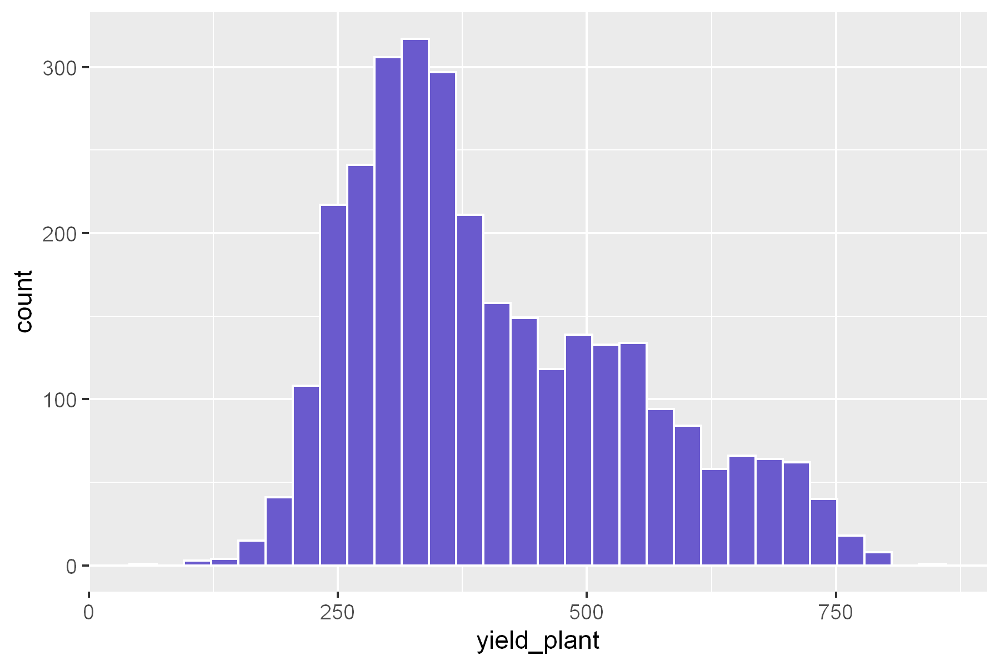

In [19]:
options(repr.plot.height = 4, repr.plot.width = 6)

ggplot(df_rice_1, aes(x = yield_plant)) + 
  geom_histogram(fill = "slateblue", color = "white")

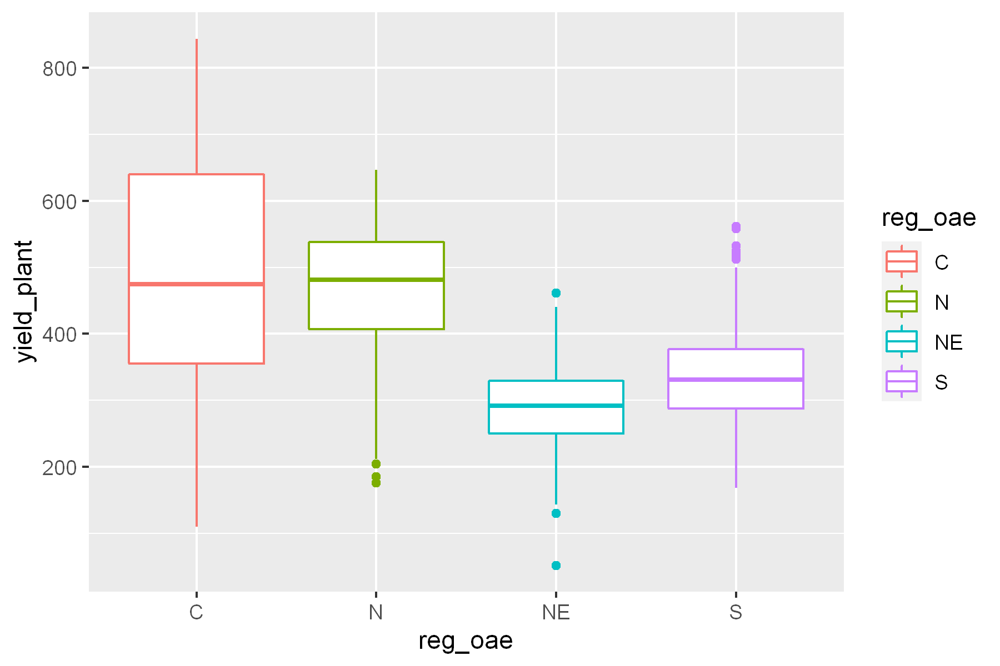

In [20]:
options(repr.plot.height = 4, repr.plot.width = 6)

ggplot(df_rice_1, aes(x = reg_oae, y = yield_plant, color = reg_oae)) + 
  geom_boxplot()

- Correlation (Scatter, Heatmap)

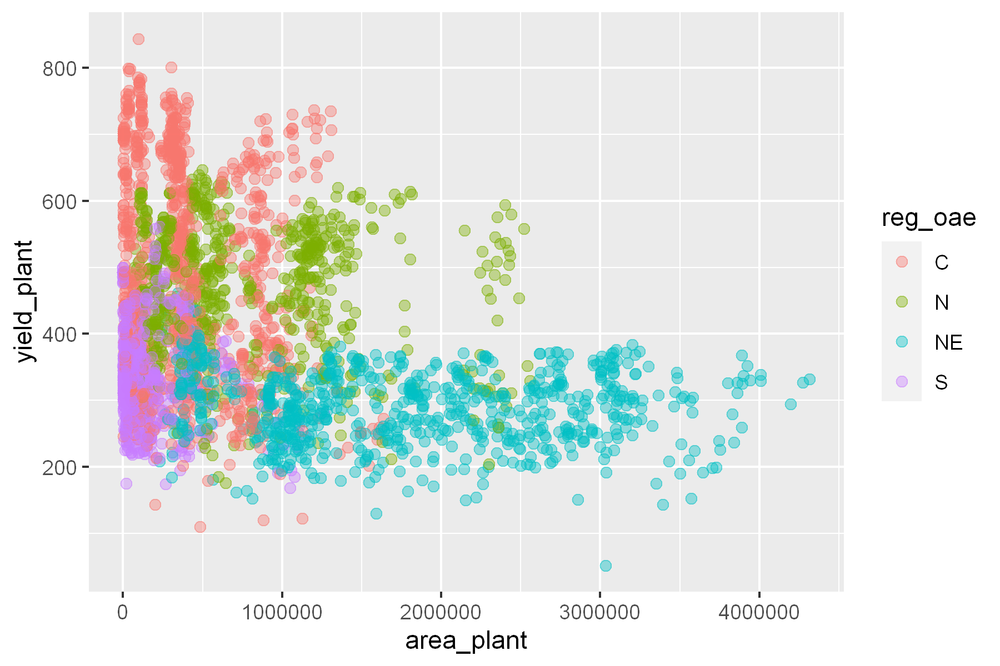

In [21]:
options(repr.plot.height = 4, repr.plot.width = 6)
ggplot(df_rice_1, aes(x = area_plant, y = yield_plant, color = reg_oae)) + 
  geom_point(size = 2, alpha = 0.4)

- Ranking (Bar)

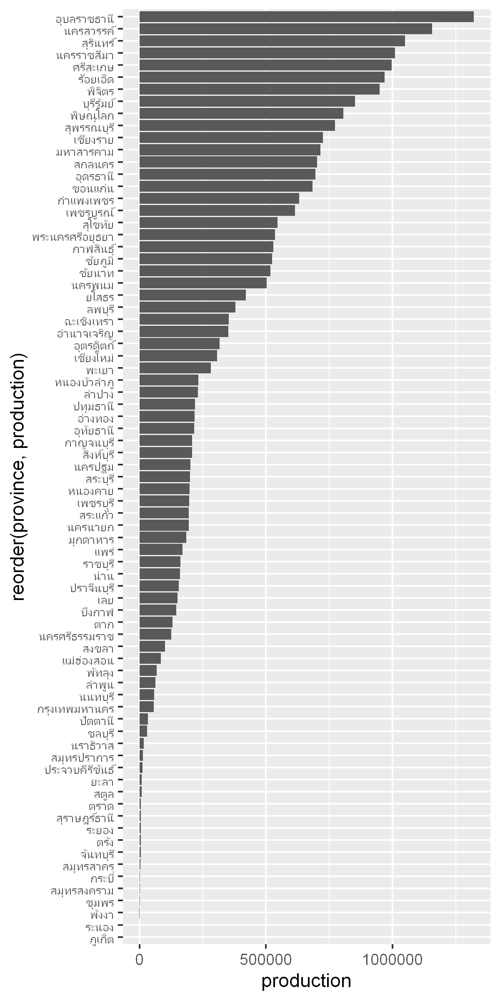

In [22]:
options(repr.plot.height = 8, repr.plot.width = 4)
ggplot(df_rice_1 %>% filter(year_crop == "2563/64"), 
       aes(x = production, y = reorder(province, production)))+
  geom_bar(stat = "identity")

- Part of a whole (Treemap)

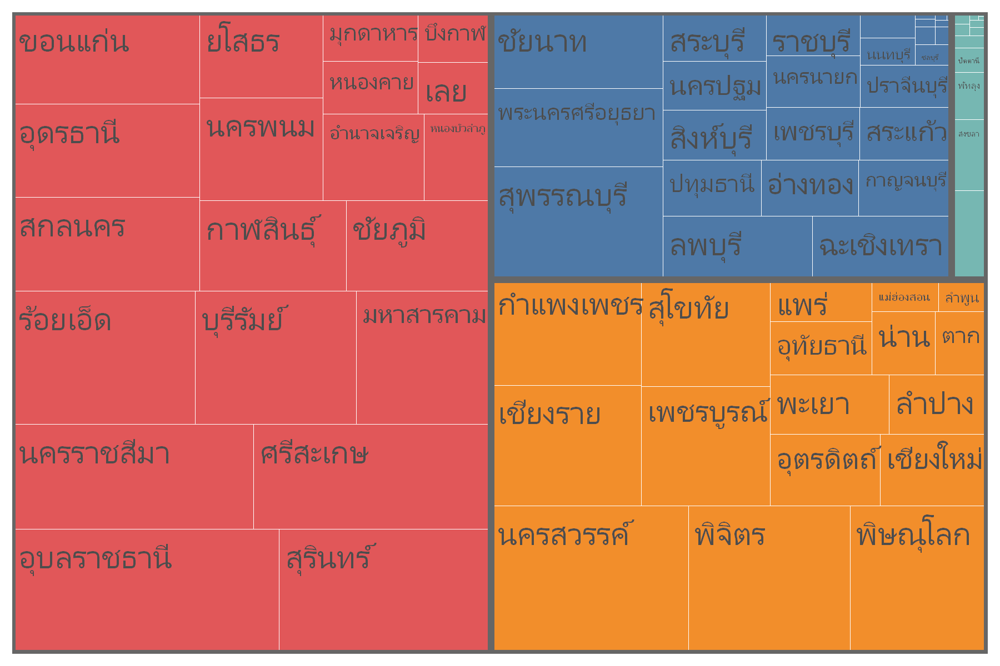

In [23]:
library(treemapify)
library(ggthemes)
options(repr.plot.height = 4, repr.plot.width = 6)

ggplot(df_rice_1 %>% filter(year_crop == "2563/64"), 
       aes(area = production,
           fill = reg_oae, 
           subgroup = reg_oae,
           label = province
          )) +
  geom_treemap(color = "white") +
  geom_treemap_subgroup_border(color = "grey40") +
  geom_treemap_text(colour = "grey30", place = "topleft", reflow = T) +
  theme(legend.position = "none") +
  scale_fill_tableau()

- Evolution (Time Series)

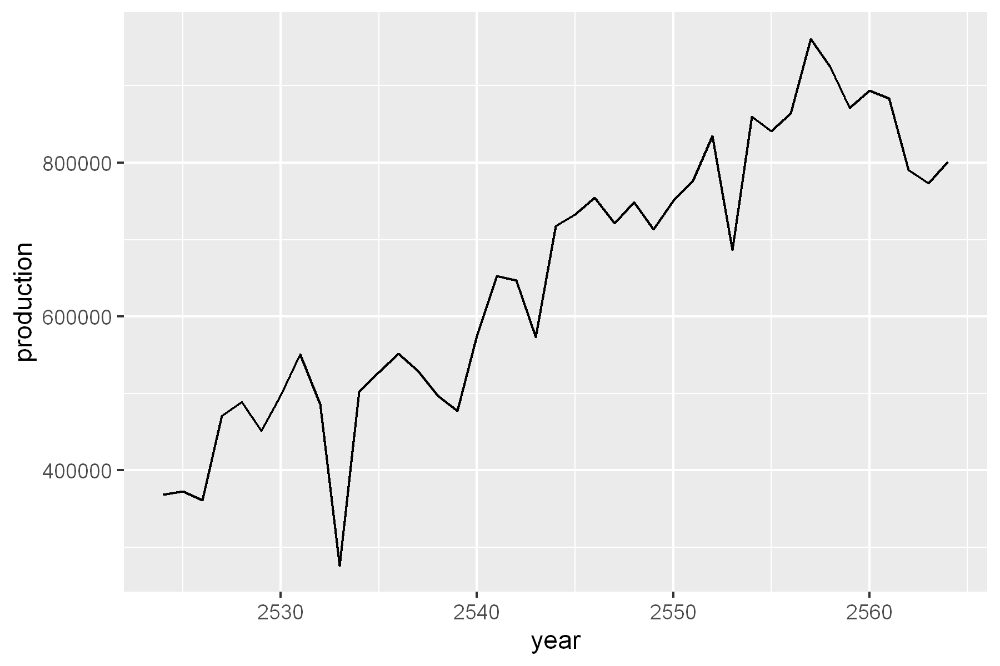

In [24]:
options(repr.plot.height = 4, repr.plot.width = 6)
ggplot(df_rice_1 %>% 
         filter(province == "สุพรรณบุรี") %>% 
         mutate(year = substr(year_crop, 1, 4) %>% as.integer()), 
       aes(x = year, y = production))+
  geom_line()

- Flow

In [25]:
ref_province <- df_rice_1 %>% 
  filter(province_code >= "TH10") %>%
  count(province, reg_oae, reg_oae, reg_osrt) %>%
  mutate(freq = 1)
ref_province

province,reg_oae,reg_osrt,n,freq
<chr>,<chr>,<chr>,<int>,<dbl>
กระบี่,S,S,41,1
กรุงเทพมหานคร,C,C,41,1
กาญจนบุรี,C,W,41,1
กำแพงเพชร,N,C,41,1
กาฬสินธุ์,NE,NE,41,1
...,...,...,...,...
อุทัยธานี,N,C,41,1
อำนาจเจริญ,NE,NE,28,1
อุบลราชธานี,NE,NE,41,1


In [26]:
reg_osrt_lvl <- c("N", "NE", "W", "C", "E", "S")
reg_oae_lvl  <- c("N", "NE", "C", "S")

In [27]:
ref_compare <- ref_province %>% mutate(
  reg_oae = factor(reg_oae, levels = reg_oae_lvl),
  reg_osrt = factor(reg_osrt, levels = reg_osrt_lvl)
)

Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."
Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."
Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."


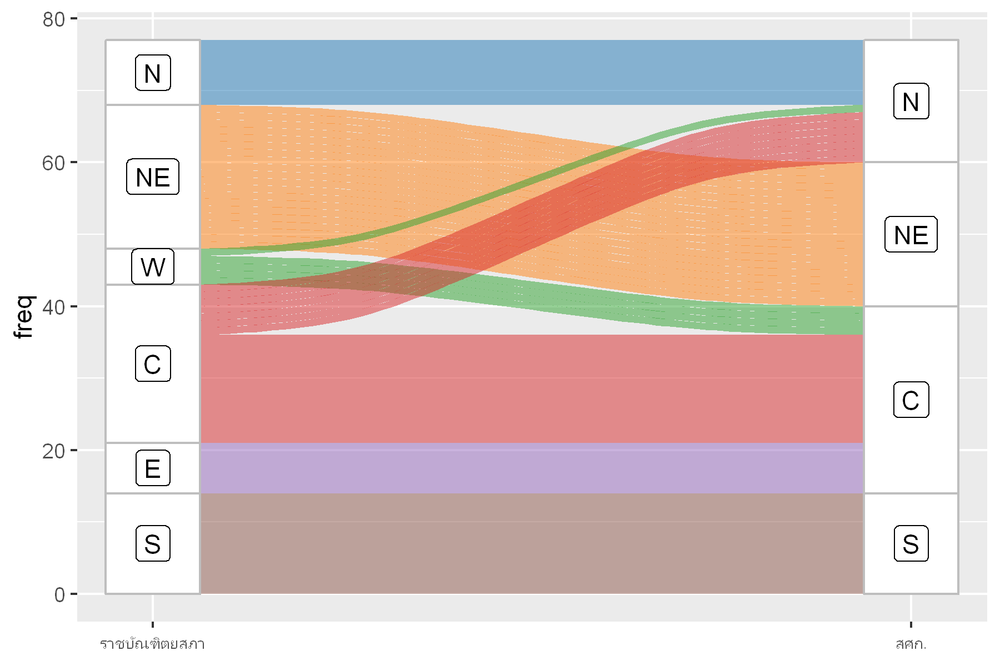

In [28]:
options(repr.plot.height = 4, repr.plot.width = 6)
ggplot(ref_compare,
       aes(y = freq, axis1 = reg_osrt, axis2 = reg_oae)) +
  geom_alluvium(aes(fill = reg_osrt), width = 1/8) +
  geom_stratum(width = 1/8, color = "grey") + 
  geom_label(stat = "stratum", aes(label = after_stat(stratum))) +
  scale_fill_d3() +
  scale_x_discrete(limits = c("ราชบัณฑิตยสภา", "สศก."), expand = c(.05, .05)) + 
  theme(legend.position = "none")

In [29]:
my_animate <- ggplot(gapminder, aes(x = gdpPercap, y = lifeExp, 
                      size = pop, color = country)) +
  geom_point(alpha = 0.7) +
  scale_size(range = c(2, 12)) +
  scale_x_log10(labels = scales::dollar) +
  guides(size = "none", color = "none") +
  facet_wrap(~continent) +
  # Special gganimate stuff
  labs(title = 'Year: {frame_time}', x = 'GDP per capita', y = 'life expectancy') +
  transition_time(year) +
  ease_aes('linear')

animate(my_animate, height = 4, width = 6, units = "in", res = 150)


Rendering [--------------------------------------------] at 3.6 fps ~ eta: 28s

Rendering [>-------------------------------------------] at 3.4 fps ~ eta: 29s

Rendering [>-------------------------------------------] at 3.2 fps ~ eta: 31s

Rendering [=>------------------------------------------] at 3.1 fps ~ eta: 31s

Rendering [==>-----------------------------------------] at 3.1 fps ~ eta: 31s

Rendering [==>-------------------------------------------] at 3 fps ~ eta: 31s

Rendering [===>------------------------------------------] at 3 fps ~ eta: 30s

Rendering [===>----------------------------------------] at 2.9 fps ~ eta: 32s

Rendering [===>----------------------------------------] at 2.6 fps ~ eta: 35s

Rendering [====>---------------------------------------] at 2.5 fps ~ eta: 35s

Rendering [====>---------------------------------------] at 2.4 fps ~ eta: 36s

Rendering [=====>--------------------------------------] at 2.4 fps ~ eta: 36s

Rendering [=====>----------------------

<img src="data:image/gif;base64,R0lGODlhhANYAvfZAAAAABoaGjoAAD8ZGQAAOhkZPwk8PDQ0ND09D2YAAGIZGWQ8C2Y6OgAA
ZhkZYgs8ZDs7ZU1NTW5NTU1NbmZmZl1uXk5hUpA6AIE/GZA6Op1iGbZmAJxlO45NTatuTY5t
Uel7dRK5KlO5EG60FRS9UAy+czy9cjq4Yi+6W0W1YhXCchnAW0fHV0jKc3rFR4uyFL6kFbup
F7KkCruFPbOeG9mYFcObBMSkF9uQOuKUFrC9R7mNb5iJZMiOTe2KUNusR8a2R8q4Sdu1TeSq
SOOyTdCVae+ff/WEbs6ubOSrbuqiaviubZnCR4vDR6TBSMDATRk/gQA6kBlinwBmtjtlnE1N
jk1uq1xtjmY6kLp9tKBrjfJ9g/p1mO9zk9B7r+xss/lvq9B8jrZ7071+9/xsyPps0+ls09N3
7udr5ex07NFz1xW+hRO7mT6EvBS4rS+1sze2kHCZtkWxu2WWpA/DlRXEpg3DrTLApEfLjEjN
mEfNpEfNrUjPtTqQ2w+20RW35Q2v8DKu002OyEmezmSd2Eil1XCqynSb8VGr+m6r5GKg72a3
/nSo+1qe7xXDyhfA40fOwEfMzEfM00fL2k3T0UfF7EfJ40fB9U3J9riHjqenrsmEi/KcifKU
kNm9gdm4lsmGrfmSrPmNv/mQs/uSuOKBsOyrm9nZn//bkPTIjtnZvP/kq///tuTkq/bVspae
x6uH1o6x0o6Z9rSJ95qx+Yyy+Kqt+bio+a+v0MKBxdCGyvmLy/iL1v+R2Nib+M2E/PGN5+WW
9fGQ68mj+tqj/9u2257Y2L3Z2ZDb/47I8rDS8qvk/7b//6vk5Lb/29nZ2f/kyP//yP//28jk
/8j//9v//+vr6///5OT//////+fc8qTRrQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwA
AAAAhANYAgAI/wCzCRxIsKDBgwgTKlzIsKHDhxAjSpxIsaLFixgzatzIsaPHjyBDihxJsqTJ
kyhTqlzJsqXLlzBjypxJs6bNmzhz6tzJs6fPn0CDCh1KtKjRo0iTKl3KtKnTp1CjSp1KtarV
q1izat3KtavXr2DDih1LtqzZs2jTql3Ltq3bt3Djyp1Lt67du3jz6t3Lt6/fv4ADCx5MuLDh
w4gTK17MuLHjx5AjS55MubLly5gza97MubNntxsAAOijMDSART9RCZiS0BUHAaIhxEK4RLTt
26wLfmJg20Ccap+DCx/el1UCAASQ0Radu6dxAM0L4rht+8Eyg9Op244u7YJ25KiJi/8fT55t
bQBRgBd83oCZz1ULmB/M/mB2tk/x2xPsDp2h6TbqfQJbcuUVaOCBXZkWHkHZLbhTErDJt95x
6RH0XHTPOXiQaqNN2B+CIIYoIlPsuTcQh9Hl5ApvyMGWYjYNYgeAfgKpRqBC01Uo3Ywmjujj
j0DulF1z/NGoG4sAyHYQNDscYBsBVChDkGoNOOOBaA8odx5pCz0HABXWePdiaEaeCNuCtemI
EH8vZlPbjUHGKeecK/F3mkDnaZiNNFdqp6abEWrHZTZUxidahVsyZJx1e4ppUGh/CvTcoKG1
sZtoUF7n0HRl0unpp6BqxGF6Fx70H3DSQPghobA9IOWeqtL/yCEAAEqDy0TaDMTmo+ipN6WL
AtmpHQGENMRfpKEmq+yyOIrWB5k9mnnnr9NyGi2MyCnHaq8a7bojnAOdl5uXVGiqiqF6yjgt
s+y2y66w6xIEKTa8tknQm9pyOChG3lKbope5Jbqfd50WdB6y7iascJyztsnfvgNZa5A0qnhi
Aab5nrlRvwwequkpCxCAwKoJcZgunrAVvPDKLIcosUFefieakZcOm3G8F3FMUJ+3EWCMo10e
Z6+q4LZs9NHlveyhzDO7J41pmFoQSxLZ1qhxt0AfVDOU1UzKkM4CZdeApkiXbbZwSlt4HMTz
iUbFMR3faPLGWTc090I684nltWf3/+23ZWkPVKpCx/oadtXbnjwR2ArhKxCkhku69sCHRv73
5Zg7FvhA0CrkNeVyX52RztfkWVDheCJ+r+p2sp3567AbtnnqAFhxunfp6Uy1aOHdPXrdkpPs
Ju+CC224K0Lr6l2HsTfv/GCzP+62ucuHd+qeHNzWu+j8An947dTsOYOEEXsskIA8ls/88+y3
r1f0jX5HQCLFa/eAJrBx6Xu4og0SEeNP+44VLJcd6sApZkxTnPsWyECwwO98SDKAFXK1n9eI
xjfVkEZ8KrQ/2rmOcN4bSM2S1IzWWBAAGKQW04jXwBa68IUwjKEMZ0jDGtrwhjjMoQ53yMMe
+vCHQAyiEP+HSMQiGvGISEyiEpfIxCY68YlQjKIUp0jFKlrxiljMoha3yMUuevGLYAyjGMdI
xjKa8YxoTKMa18jGNrrxjXDsyTPmSMc62vGOeMyjHvfIxz768Y+ADKQgB0nIQhrykH1cCCIX
ychGOvKRkIykJA+pyEla8pKYzKQmN0nIqXDyk6AMpShHGchKkvKUqEylKh9pylW68pWwjOUc
PSnLWtrylptsJS53yctedlIhvgymMIeJR1oS85jIxKUuk8nMZqJymc6MpjQ1acxpWvOakoQm
NrfJzUFqs5vgDGceqynOcpqTjt88pzqxmc51ujOa5HynPKXZznnaU5j1vKc+dxn/z336s5f5
/KdAXRnQgRr0lP08qEJVWdCFOpSawHyoRJ8plYladJQNvahGF5nRjXr0l1H5qEgn2dGRmnSP
JT2pSu2Y0JW6NJERfalM/5jSmZq0pTbN6TNqqlOP8rSnGsWpQYsQAELckQMBCIAUjlFHVWAA
CkzV6U+nSVSjWrIVT53pVO8phKL60alQlalQB6oBpdqRqEmVgh3BGtWcbjWaZVXrJZ/a1pW+
dZ5x/SpdxVpRi6ZiAAcoQCLqWFWgojSm9kQCYAVr2Eje9Z2eWOxgG1vMvk7UAw9QrCDoWNak
OsAYGJACDgLggG3s9Rk6GEAAHpCMOu4AAUktwByCith5/+KgtANoAx0j24YiDKAAVniGYgPw
NjqCLKmymaNTpTAD0oI2rM/YgWofYAjXwjYABYgDHVUhgdjOdp+PdecMcKvb7X4gttqd42lf
i16RjtWfp1CAWhfwAM4mlbSmNcB0zxVWtMY2FnP0wH3va9WJhveY8VXraSNrAdVidw4ONusz
IjvgArTWqfoNABRMG9YfVLi1z2jugL3q1BEX2J4HPmeCT4GB+ioXAyZ+BljnKOIBn/ii792n
Ery64wITgcQwboM21AtVpxYAwETVrVM/O8fIytXAtX0nUTfb4yartrpASOpmFVvkBWR3jr5V
a4mDK2O6GhnASAiAkjHA5AkPQP+tkbUCUxX7ZBRH+aKFJepkI0sFY7hZzAvocpud/NEc61MD
TE4wHQv7DDb7mcjHSIWa9aiJTFBAtXV+aIqHiWg/K1q4b55jfMPKVt7W0QOfXfKjGw3VyG42
j9vYwaXN+lcDpAAXAt10OTv9jE8nYQC2xkUxthvotm7D0pgutGUdSuEBt7nKbH0xVBV7Y1FH
OK04vrM6m33fRA+AzJ9+hgag6t8KxyLaZW71AKrt5hHLtbNJpQKA9anrcHLbs4+GdwAm8Oi9
/tXdyg6pRHsw4qSWt7DoZiu17xjfAFhAC5rYhnyznZB7jrbgujV1ryc+x3Efo9z3tXDC6RrZ
RjBcAfv/nsMrwr2JBdz3Ac2gt7YlWuMBl/cZmXA5vtna8AlcYeUc36ih59kK+rZ11Ez1sFFH
DtW/3ny3AygEHf+aaYfWm5fo3r

# A tibble: 100 x 7
   format width height colorspace matte filesize density
   <chr>  <int>  <int> <chr>      <lgl>    <int> <chr>  
 1 gif      900    600 sRGB       FALSE        0 59x59  
 2 gif      900    600 sRGB       TRUE         0 59x59  
 3 gif      900    600 sRGB       TRUE         0 59x59  
 4 gif      900    600 sRGB       TRUE         0 59x59  
 5 gif      900    600 sRGB       TRUE         0 59x59  
 6 gif      900    600 sRGB       TRUE         0 59x59  
 7 gif      900    600 sRGB       TRUE         0 59x59  
 8 gif      900    600 sRGB       TRUE         0 59x59  
 9 gif      900    600 sRGB       TRUE         0 59x59  
10 gif      900    600 sRGB       TRUE         0 59x59  
# ... with 90 more rows

## Dynamics
เป็นการแสดงกราฟที่ผู้ใช้สามารถ interact ได้ เช่น zoom, mouse hover, mouse click เป็นต้น ส่วนใหญ่จะใช้ javascript ในการประมวลผลและแสดงผลบนเวบ สำหรับมี library หลายตัว เช่น
- [plotly](https://plotly.com/r/)
- [echart](https://echarts4r.john-coene.com)
- [highcharters](https://jkunst.com/highcharter/)
- [d3](https://rstudio.github.io/r2d3/)
- และอื่นๆ อีกมากมาย

In [30]:
g <- ggplot(df_rice_1, aes(x = reg_oae, y = yield_plant)) + 
  geom_boxplot()

plotly::ggplotly(g)

HTML widgets cannot be represented in plain text (need html)

# Map

มีหลาย file format ที่นิยม เช่น
- geojson
- shapefile
- geotif

website ที่แจกข้อมูลแผนที่
- https://www.naturalearthdata.com/downloads/
- http://www.diva-gis.org/gdata
- https://data.humdata.org/dataset/thailand-administrative-boundaries
- https://github.com/16EAGLE/getSpatialData

## Static

In [31]:
df_map <- df %>%
  filter(subcommod == "ข้าวนาปี", year_crop == "2563/64")

In [32]:
df_map <- tha1 %>% left_join(df_map, by = c("adm1_pcode" = "province_code"))

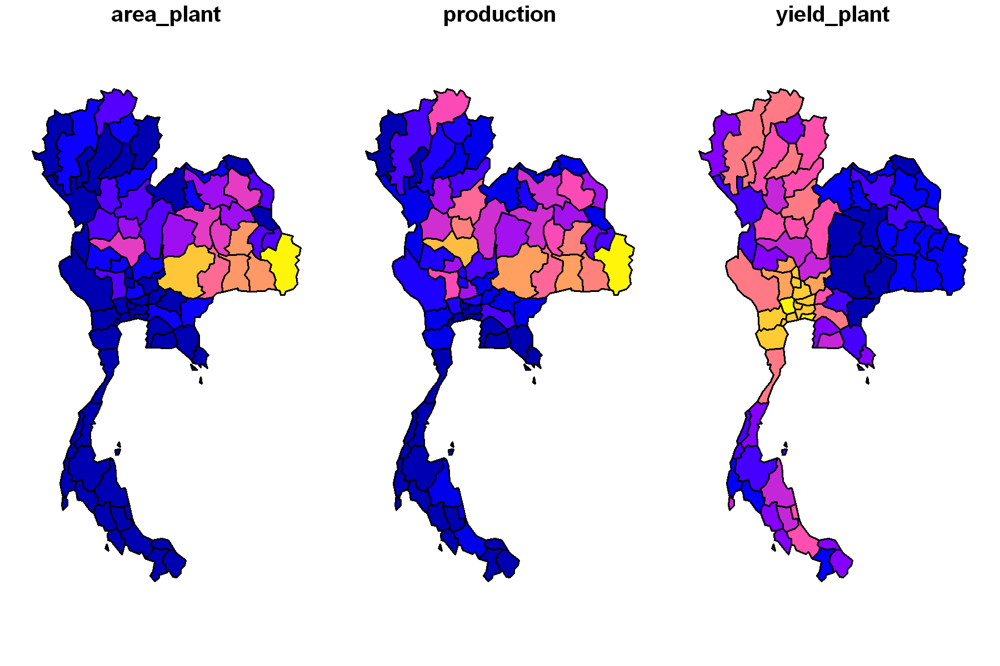

In [33]:
plot(df_map[c('area_plant', 'production', 'yield_plant')])

## Dynamics

In [34]:
leaflet(df_map) %>%
  addTiles() %>%
  addPolygons()

HTML widgets cannot be represented in plain text (need html)

In [35]:
## advance
pal <- colorBin("magma", domain = df_map$production, reverse = TRUE)

labels <- glue::glue(
  "<strong>{df_map$adm1_th}</strong><br/>
  ปีเพาะปลูก: {df_map$year_crop}<br/>
  ผลผลิต: {df_map$production} ตัน <br/>"
) %>% lapply(htmltools::HTML)

leaflet(df_map) %>%
  addProviderTiles(providers$CartoDB.Voyager) %>%
  addPolygons(
    fillColor = ~pal(production),
    weight = 1,
    opacity = 1,
    color = "white",
    dashArray = "3",
    fillOpacity = 0.7,
    highlight = highlightOptions(
      weight = 5,
      color = "#666",
      dashArray = "",
      fillOpacity = 0.7,
      bringToFront = TRUE
    ),
    label = labels
  ) %>%
  addLegend(
    pal = pal, values = ~production, opacity = 0.7, 
    title = "ผลผลิต (ตัน)", position = "bottomright"
  )

HTML widgets cannot be represented in plain text (need html)

# Put it all together
แรงบันดาลใจมาจาก https://www.cedricscherer.com/2019/05/17/the-evolution-of-a-ggplot-ep.-1/

In [36]:
df

commod,subcommod,season,variety,year_crop,year,province,province_code,reg_oae,reg_nesdb,reg_osrt,status,update_date,area_plant,area_harvest,production,yield_plant,yield_harvest
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,ประเทศไทย,TH00,NA,NA,NA,สถิติ,2556-11-21,56392231,53383281,15757745,279.4311,295.1813
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,ภาคเหนือ,TH01,NA,NA,NA,สถิติ,2556-11-21,12655814,12422132,5258621,415.5103,423.3268
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,ภาคตะวันออกเฉียงเหนือ,TH02,NA,NA,NA,สถิติ,2556-11-21,28000661,26103169,5389709,192.4851,206.4772
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,ภาคกลาง,TH03,NA,NA,NA,สถิติ,2556-11-21,11660934,11415444,4010097,343.8916,351.2870
ข้าว,ข้าวนาปี,1,ข้าวรวม,2524/25,2524,ภาคใต้,TH06,NA,NA,NA,สถิติ,2556-11-21,4074822,3442536,1099318,269.7831,319.3338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ข้าว,ข้าวเหนียวนาปรัง,2,ข้าวเหนียวรวม,2563/64,2564,อุตรดิตถ์,TH53,N,N,N,พยากรณ์,2556-06-25,12631,12568,7882,624.0203,627.1483
ข้าว,ข้าวเหนียวนาปรัง,2,ข้าวเหนียวรวม,2563/64,2564,อำนาจเจริญ,TH37,NE,NE,NE,พยากรณ์,2556-06-25,510,510,237,464.7059,464.7059
ข้าว,ข้าวเหนียวนาปรัง,2,ข้าวเหนียวรวม,2563/64,2564,อุบลราชธานี,TH34,NE,NE,NE,พยากรณ์,2556-06-25,40156,40036,19877,494.9945,496.4782


In [37]:
region_label = c(
  "N" = "เหนือ",
  "NE" = "ตะวันออก\nเฉียงเหนือ",
  "C" = "กลาง",
  "S" = "ใต้"
)
region_label

N                     NE                      C 
               "เหนือ" "ตะวันออก\nเฉียงเหนือ"                 "กลาง" 
                     S 
                 "ใต้"

In [38]:
df_rice_major <- df %>%
  filter(subcommod == "ข้าวนาปี", year_crop == "2564/65", !is.na(reg_oae)) %>%
  mutate(region = as_factor(region_label[reg_oae]))

df_rice_major

commod,subcommod,season,variety,year_crop,year,province,province_code,reg_oae,reg_nesdb,reg_osrt,status,update_date,area_plant,area_harvest,production,yield_plant,yield_harvest,region
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,เชียงราย,TH57,N,N,N,พยากรณ์,2564-06-25,1309930,1279807,734611,560.8017,574.0014,เหนือ
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,พะเยา,TH56,N,N,N,พยากรณ์,2564-06-25,638268,628735,297646,466.3339,473.4045,เหนือ
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,ลำปาง,TH52,N,N,N,พยากรณ์,2564-06-25,447301,443723,234476,524.2018,528.4288,เหนือ
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,ลำพูน,TH51,N,N,N,พยากรณ์,2564-06-25,110133,109371,66659,605.2591,609.4760,เหนือ
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,เชียงใหม่,TH50,N,N,N,พยากรณ์,2564-06-25,528229,523726,318664,603.2687,608.4556,เหนือ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,สงขลา,TH90,S,S,S,พยากรณ์,2564-06-25,196668,182973,102074,519.0168,557.8637,ใต้
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,สตูล,TH91,S,S,S,พยากรณ์,2564-06-25,19999,19999,8864,443.2222,443.2222,ใต้
ข้าว,ข้าวนาปี,1,ข้าวรวม,2564/65,2564,ปัตตานี,TH94,S,S,S,พยากรณ์,2564-06-25,76887,76887,34753,452.0010,452.0010,ใต้


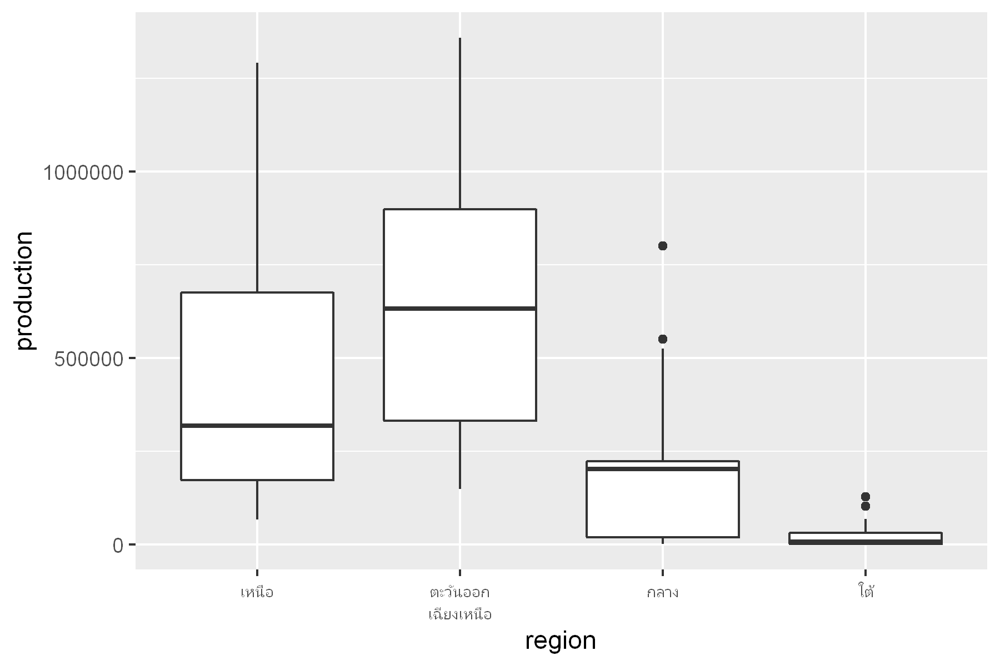

In [39]:
options(repr.plot.height = 4, repr.plot.width = 6)
ggplot(df_rice_major, aes(x = region, y = production)) +
  geom_boxplot()

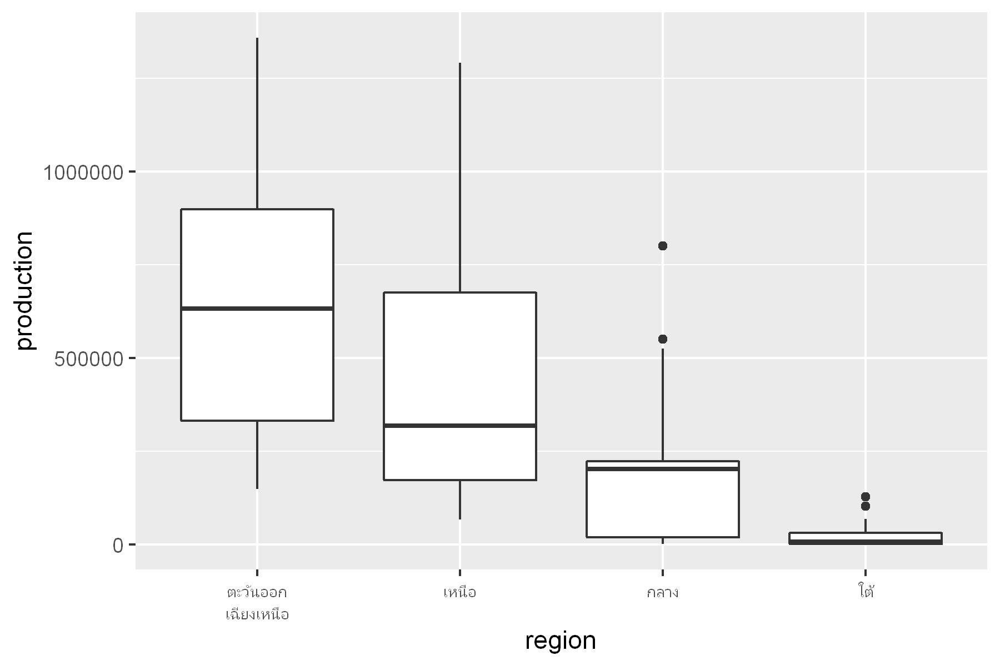

In [40]:
df_sorted <-
  df_rice_major %>%
  mutate(region = fct_reorder(region, -production))

ggplot(df_sorted, aes(x = region, y = production)) +
  geom_boxplot()

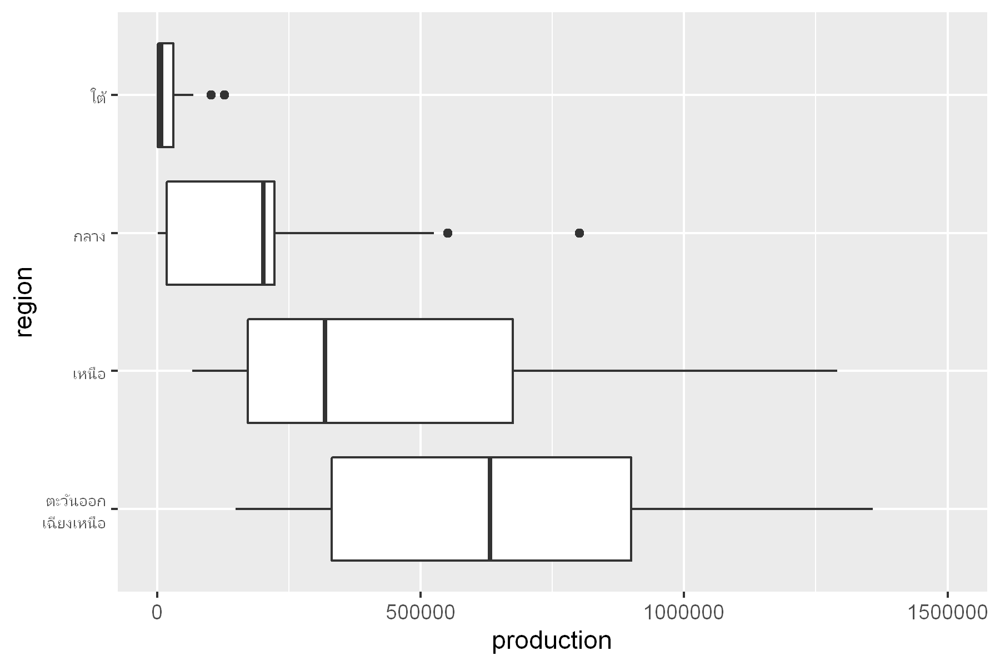

In [41]:
ggplot(df_sorted, aes(x = region, y = production)) +
  geom_boxplot() +
  coord_flip() +
  scale_y_continuous(limits = c(0, 15e5))

In [42]:
g <-
  ggplot(df_sorted, aes(x = region, y = production, color = region)) +
    coord_flip() +
    scale_y_comma(
      limits = c(0, 1.6e6), n.breaks = 3
    ) +
    scale_color_uchicago() +
    labs(x = NULL, y = "ปริมาณผลผลิต (ตัน)") + 
    theme(
      legend.position = "none",
      axis.title = element_text(size = 10),
      panel.grid = element_blank()
    )

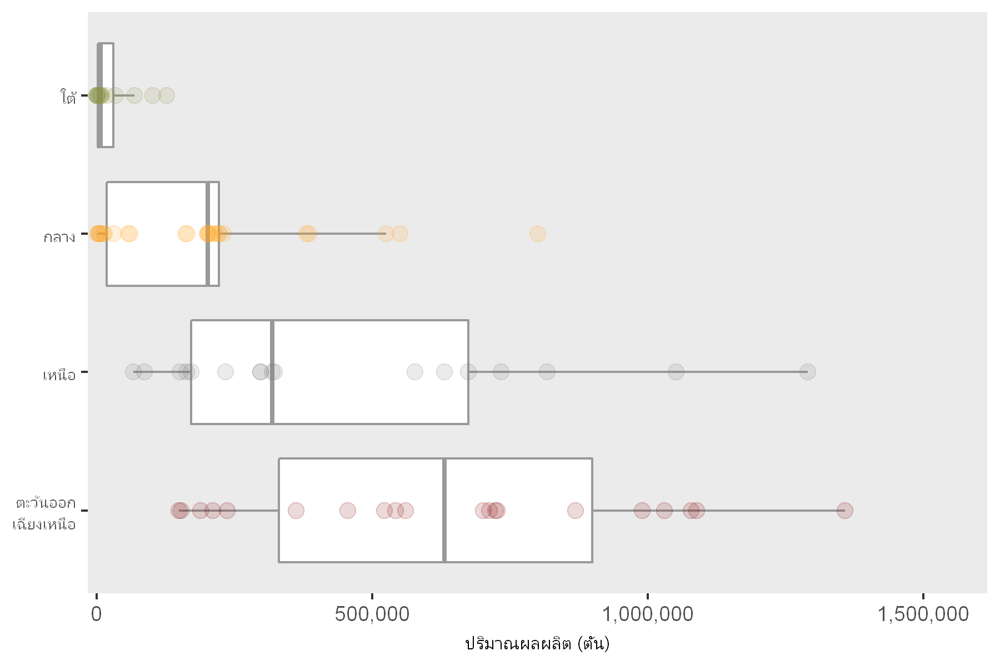

In [43]:
g + 
  geom_boxplot(color = "gray60", outlier.alpha = 0) +
  geom_point(size = 3, alpha = 0.15)

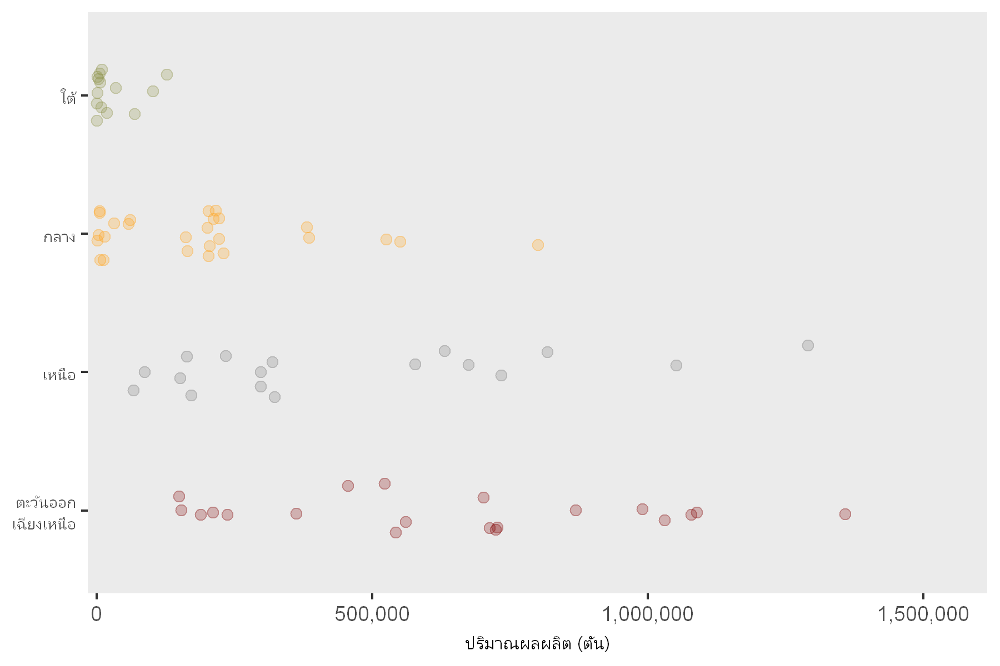

In [44]:
set.seed(123)

g + geom_jitter(size = 2, alpha = 0.25, width = 0.2)

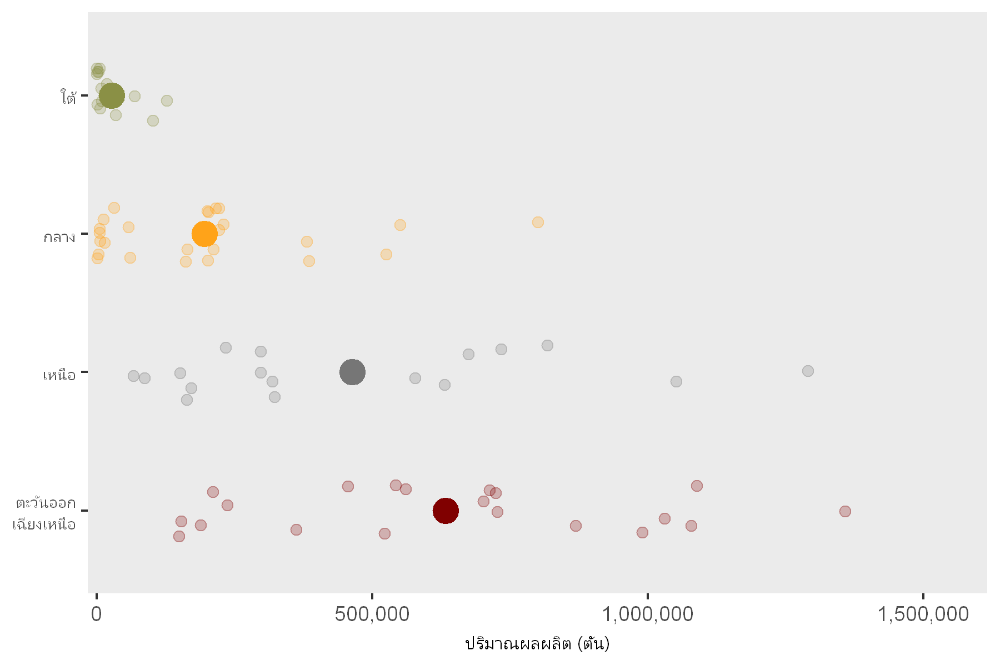

In [45]:
g +
  geom_jitter(size = 2, alpha = 0.25, width = 0.2) +
  stat_summary(fun = mean, geom = "point", size = 5)

In [46]:
tha_avg <-
  df_rice_major %>%
  summarize(avg = mean(production, na.rm = TRUE)) %>%
  pull(avg)

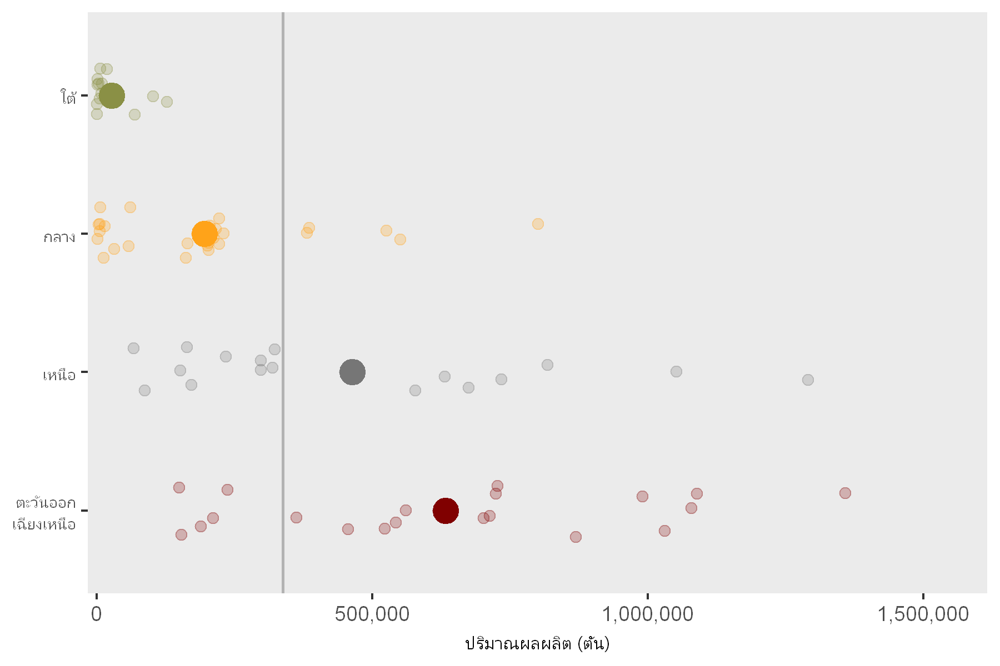

In [47]:
g +
  geom_hline(aes(yintercept = tha_avg), color = "gray70", size = 0.6) +
  stat_summary(fun = mean, geom = "point", size = 5) +
  geom_jitter(size = 2, alpha = 0.25, width = 0.2)

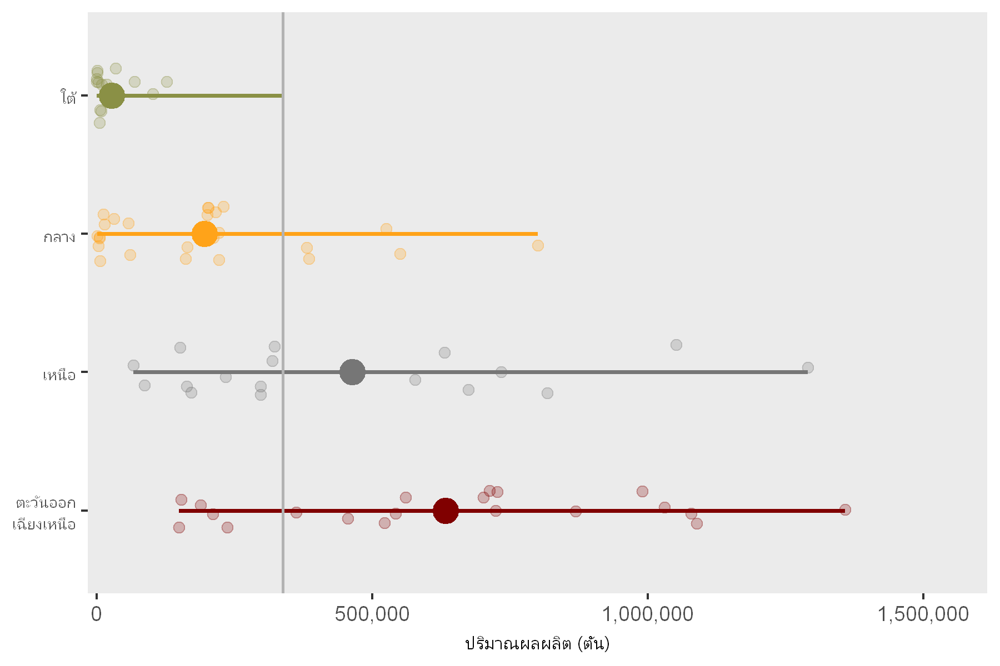

In [48]:
g +
  geom_segment(
    aes(x = region, xend = region,
        y = tha_avg, yend = production),
    size = 0.8
  ) +
  geom_hline(aes(yintercept = tha_avg), color = "gray70", size = 0.6) +
  geom_jitter(size = 2, alpha = 0.25, width = 0.2) +
  stat_summary(fun = mean, geom = "point", size = 5)

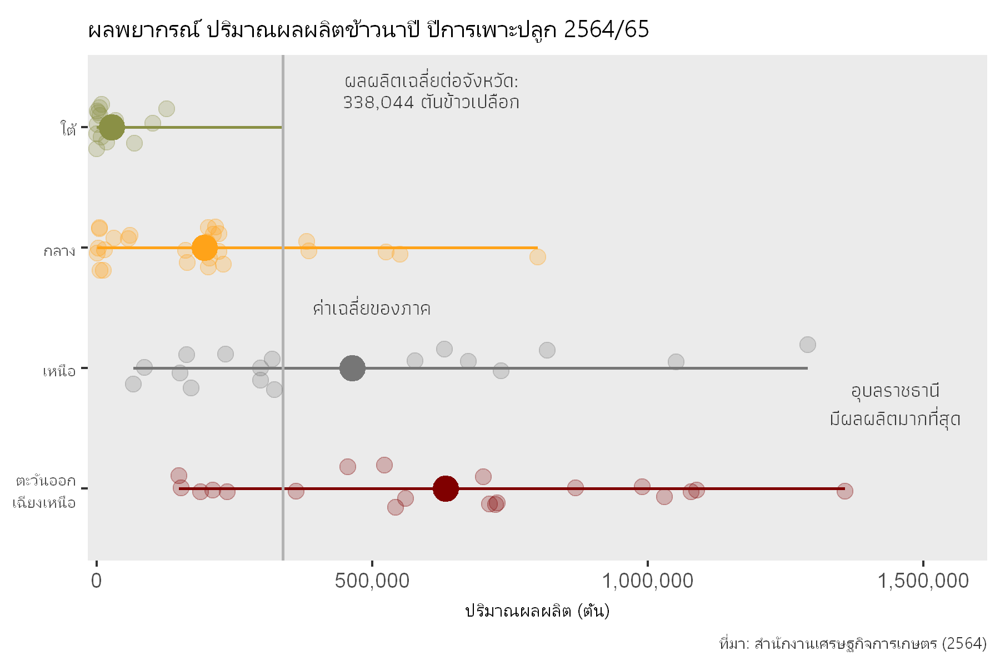

In [49]:
set.seed(123)
(g_text <-
  g +
  geom_segment(
    aes(x = region, xend = region,
        y = tha_avg, yend = production),
    size = 0.6
  ) +
  geom_hline(aes(yintercept = tha_avg), color = "gray70", size = 0.6) +
  geom_jitter(size = 3, alpha = 0.25, width = 0.2) +
  stat_summary(fun = mean, geom = "point", size = 5) +
  annotate(
    "text", x = 4.3, y = 1.8*round(tha_avg, 0), family = "Athiti", size = 3, color = "gray20", lineheight = .9,
    label = glue::glue("ผลผลิตเฉลี่ยต่อจังหวัด:\n{format(round(tha_avg, 0), big.mark=',')} ตันข้าวเปลือก")
  ) +
  annotate(
    "text", x = 2.5, y = 5e5, family = "Athiti", size = 3, color = "gray20",
    label = "ค่าเฉลี่ยของภาค"
  ) +
  annotate(
    "text", x = 1.7, y = 1.45e6, family = "Athiti", size = 3, color = "gray20",
    label = "อุบลราชธานี\nมีผลผลิตมากที่สุด"
  ) +
 labs(
   title = "ผลพยากรณ์ ปริมาณผลผลิตข้าวนาปี ปีการเพาะปลูก 2564/65",
   caption = "ที่มา: สำนักงานเศรษฐกิจการเกษตร (2564)"
 ) +
 theme(plot.caption = element_text(size = 9, color = "gray20"))
)

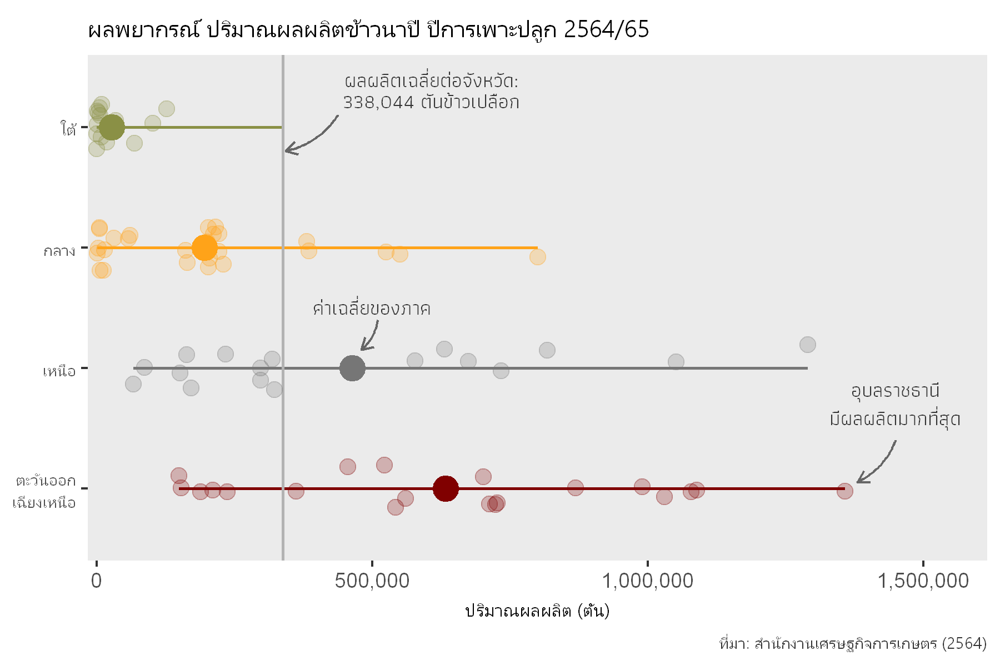

In [50]:
set.seed(123)
arrows <-
  tibble(
    x1 = c(4.1, 2.4, 1.4),
    x2 = c(3.8, 2.15, 1.05),
    y1 = c(tha_avg + 100000, 5.1e5, 1.45e6),
    y2 = c(tha_avg + 5000, 4.8e5, 1.38e6)
  )

(g_arrows <-
  g_text +
  geom_curve(
    data = arrows, aes(x = x1, y = y1, xend = x2, yend = y2),
    arrow = arrow(length = unit(0.08, "inch")), size = 0.5,
    color = "gray40", curvature = -0.2
  )
)

# Resources

- หนังสือ ggplot โดย Hadley Wickham ผู้สร้าง `ggplot` (https://ggplot2-book.org)
- หนังสือ R for Data Science โดย Hadley Wickham (https://r4ds.had.co.nz)
- A ggplot2 Tutorial for Beautiful Plotting in R by Cédric (https://www.cedricscherer.com/2019/08/05/a-ggplot2-tutorial-for-beautiful-plotting-in-r/)
- รวบรวม chart รูปแบบต่าง ๆ พร้อมวิธีการสร้างโดยใช้ R (https://www.r-graph-gallery.com)
- รวบรวม chart รูปแบบต่าง ๆ พร้อมแนวทางการเลือกงาน (https://www.data-to-viz.com)
- สอนการใช้ leaflet (https://rstudio.github.io/leaflet/)
- https://evamaerey.github.io/ggplot_flipbook/ggplot_flipbook_xaringan.html